***Group 16***<br>
**William (Billy) Edwards**<br>
**Samihan Jawalkar**<br>
**Shubham Shah**<br>
**Reetesh Zope**

#Tasks

Through this notebook we will first clean the data to ensure any modeling can be performed on the data. This includes handling missing and null values, dropping outliers, and standardizing the data. After this part, we will go through exploratory data analysis to look for relationships amongst the variables. We will utilize box plots, scatter plot matrices, histogram matrices, and heat maps to look at these relationships. We will try to see if increasing humidity, precipitation, air temperature, and vegetation index is more likely to predict an increase in the total Dengue cases for each (city, year, and weekofyear).

#Dataset

The features in this dataset

We are provided the following set of information on a (year, weekofyear) timescale:

(Where appropriate, units are provided as a _unit suffix on the feature name.)
City and date indicators

    city – City abbreviations: sj for San Juan and iq for Iquitos
    week_start_date – Date given in yyyy-mm-dd format

NOAA's GHCN daily climate data weather station measurements

    station_max_temp_c – Maximum temperature
    station_min_temp_c – Minimum temperature
    station_avg_temp_c – Average temperature
    station_precip_mm – Total precipitation
    station_diur_temp_rng_c – Diurnal temperature range

PERSIANN satellite precipitation measurements (0.25x0.25 degree scale)

    precipitation_amt_mm – Total precipitation

NOAA's NCEP Climate Forecast System Reanalysis measurements (0.5x0.5 degree scale)

    reanalysis_sat_precip_amt_mm – Total precipitation
    reanalysis_dew_point_temp_k – Mean dew point temperature
    reanalysis_air_temp_k – Mean air temperature
    reanalysis_relative_humidity_percent – Mean relative humidity
    reanalysis_specific_humidity_g_per_kg – Mean specific humidity
    reanalysis_precip_amt_kg_per_m2 – Total precipitation
    reanalysis_max_air_temp_k – Maximum air temperature
    reanalysis_min_air_temp_k – Minimum air temperature
    reanalysis_avg_temp_k – Average air temperature
    reanalysis_tdtr_k – Diurnal temperature range

Satellite vegetation - Normalized difference vegetation index (NDVI) - NOAA's CDR Normalized Difference Vegetation Index (0.5x0.5 degree scale) measurements

    ndvi_se – Pixel southeast of city centroid
    ndvi_sw – Pixel southwest of city centroid
    ndvi_ne – Pixel northeast of city centroid
    ndvi_nw – Pixel northwest of city centroid


#Data Cleaning

In [1]:
#importing libraries
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix
from scipy.stats import zscore
import scipy
import numpy as np
from scipy.cluster import hierarchy as sch

In [2]:
#reading the file
df = pd.read_csv('../data/dengue_features_train.csv')

In [3]:
#looking through the data
df.head()

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
0,sj,1990,18,4/30/1990,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,295.9,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4
1,sj,1990,19,5/7/1990,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,296.4,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5
2,sj,1990,20,5/14/1990,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,297.3,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,4
3,sj,1990,21,5/21/1990,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,297.0,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,3
4,sj,1990,22,5/28/1990,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,297.5,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,6


In [4]:
#describing the statistical information of the data
df.describe()

,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
count,1456.000000,1456.000000,1262.000000,1404.000000,1434.000000,1434.000000,1443.000000,1446.000000,1446.000000,1446.000000,1446.000000,1446.000000,1446.000000,1446.000000,1443.000000,1446.000000,1446.000000,1413.000000,1413.000000,1436.000000,1442.000000,1434.000000,1456.000000
mean,2001.031593,26.503434,0.142294,0.130553,0.203783,0.202305,45.760388,298.701852,299.225578,295.246356,303.427109,295.719156,40.151819,82.161959,45.760388,16.746427,4.903754,27.185783,8.059328,32.452437,22.102150,39.326360,24.675137
std,5.408314,15.019437,0.140531,0.119999,0.073860,0.083903,43.715537,1.362420,1.261715,1.527810,3.234601,2.565364,43.434399,7.153897,43.715537,1.542494,3.546445,1.292347,2.128568,1.959318,1.574066,47.455314,43.596000
min,1990.000000,1.000000,-0.406250,-0.456100,-0.015533,-0.063457,0.000000,294.635714,294.892857,289.642857,297.800000,286.900000,0.000000,57.787143,0.000000,11.715714,1.357143,21.400000,4.528571,26.700000,14.700000,0.000000,0.000000
25%,1997.000000,13.750000,0.044950,0.049217,0.155087,0.144209,9.800000,297.658929,298.257143,294.118929,301.000000,293.900000,13.055000,77.177143,9.800000,15.557143,2.328571,26.300000,6.514286,31.100000,21.100000,8.700000,5.000000
50%,2002.000000,26.500000,0.128817,0.121429,0.196050,0.189450,38.340000,298.646429,299.289286,295.640714,302.400000,296.200000,27.245000,80.301429,38.340000,17.087143,2.857143,27.414286,7.300000,32.800000,22.200000,23.850000,12.000000
75%,2005.000000,39.250000,0.248483,0.216600,0.248846,0.246982,70.235000,299.833571,300.207143,296.460000,305.500000,297.900000,52.200000,86.357857,70.235000,17.978214,7.625000,28.157143,9.566667,33.900000,23.300000,53.900000,28.000000
max,2010.000000,53.000000,0.508357,0.454429,0.538314,0.546017,390.600000,302.200000,302.928571,298.450000,314.000000,299.900000,570.500000,98.610000,390.600000,20.461429,16.028571,30.800000,15.800000,42.200000,25.600000,543.300000,461.000000


Here we can get our first overview of our features. It is clear from the count values that several have missing data which we will later impute. It's also relevant to note the scales of some of the features are quite different such as the mean diurnal temperature range "reanalysis_tdtr_k" (4.9) versus the total precipitation amount "reanalysis_sat_precip_amt_mm" (45.76). These features will need to be standardized to avoid skewing predictions. 

In [5]:
#getting info of all the columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1456 entries, 0 to 1455
Data columns (total 25 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   city                                   1456 non-null   object 
 1   year                                   1456 non-null   int64  
 2   weekofyear                             1456 non-null   int64  
 3   week_start_date                        1456 non-null   object 
 4   ndvi_ne                                1262 non-null   float64
 5   ndvi_nw                                1404 non-null   float64
 6   ndvi_se                                1434 non-null   float64
 7   ndvi_sw                                1434 non-null   float64
 8   precipitation_amt_mm                   1443 non-null   float64
 9   reanalysis_air_temp_k                  1446 non-null   float64
 10  reanalysis_avg_temp_k                  1446 non-null   float64
 11  rean

From the output we see three different data types, of which only two are non-numerical. Both "city" and "week_start_date" are listed as objects. The city feature will be converted to a categorical variable, while "week_start_date" will be converted to date time. There are also 25 columns in the dataset and 1,456 rows of data. 

In [6]:
#checking number of rows and columns
df.shape

(1456, 25)

In [7]:
#percentage of null values
df.isnull().sum() * 100 / len(df)


city                                      0.000000
year                                      0.000000
weekofyear                                0.000000
week_start_date                           0.000000
ndvi_ne                                  13.324176
ndvi_nw                                   3.571429
ndvi_se                                   1.510989
ndvi_sw                                   1.510989
precipitation_amt_mm                      0.892857
reanalysis_air_temp_k                     0.686813
reanalysis_avg_temp_k                     0.686813
reanalysis_dew_point_temp_k               0.686813
reanalysis_max_air_temp_k                 0.686813
reanalysis_min_air_temp_k                 0.686813
reanalysis_precip_amt_kg_per_m2           0.686813
reanalysis_relative_humidity_percent      0.686813
reanalysis_sat_precip_amt_mm              0.892857
reanalysis_specific_humidity_g_per_kg     0.686813
reanalysis_tdtr_k                         0.686813
station_avg_temp_c             

Listed above, we see that all but five of the variables have missing data. Since the data missing is under 50%, we will impute the values based on the median of the variable. The median was chosen since most of the variable have outliers and imputing on the mean would capture more of that skewness in the data. 

In [8]:
#imputing median for null values
for i,colname in enumerate(list(df.columns)):
  if df[colname].isnull().sum() * 100 / len(df):
    df[colname].fillna(df[colname].median(), inplace=True)

df.isnull().sum() * 100 / len(df)

city                                     0.0
year                                     0.0
weekofyear                               0.0
week_start_date                          0.0
ndvi_ne                                  0.0
ndvi_nw                                  0.0
ndvi_se                                  0.0
ndvi_sw                                  0.0
precipitation_amt_mm                     0.0
reanalysis_air_temp_k                    0.0
reanalysis_avg_temp_k                    0.0
reanalysis_dew_point_temp_k              0.0
reanalysis_max_air_temp_k                0.0
reanalysis_min_air_temp_k                0.0
reanalysis_precip_amt_kg_per_m2          0.0
reanalysis_relative_humidity_percent     0.0
reanalysis_sat_precip_amt_mm             0.0
reanalysis_specific_humidity_g_per_kg    0.0
reanalysis_tdtr_k                        0.0
station_avg_temp_c                       0.0
station_diur_temp_rng_c                  0.0
station_max_temp_c                       0.0
station_mi

In [9]:
#converting city into categorical varible using label encoding
label_encoder = LabelEncoder()
df['city'] = label_encoder.fit_transform(df['city'])

In [10]:
df['city']

0       1
1       1
2       1
3       1
4       1
       ..
1451    0
1452    0
1453    0
1454    0
1455    0
Name: city, Length: 1456, dtype: int64

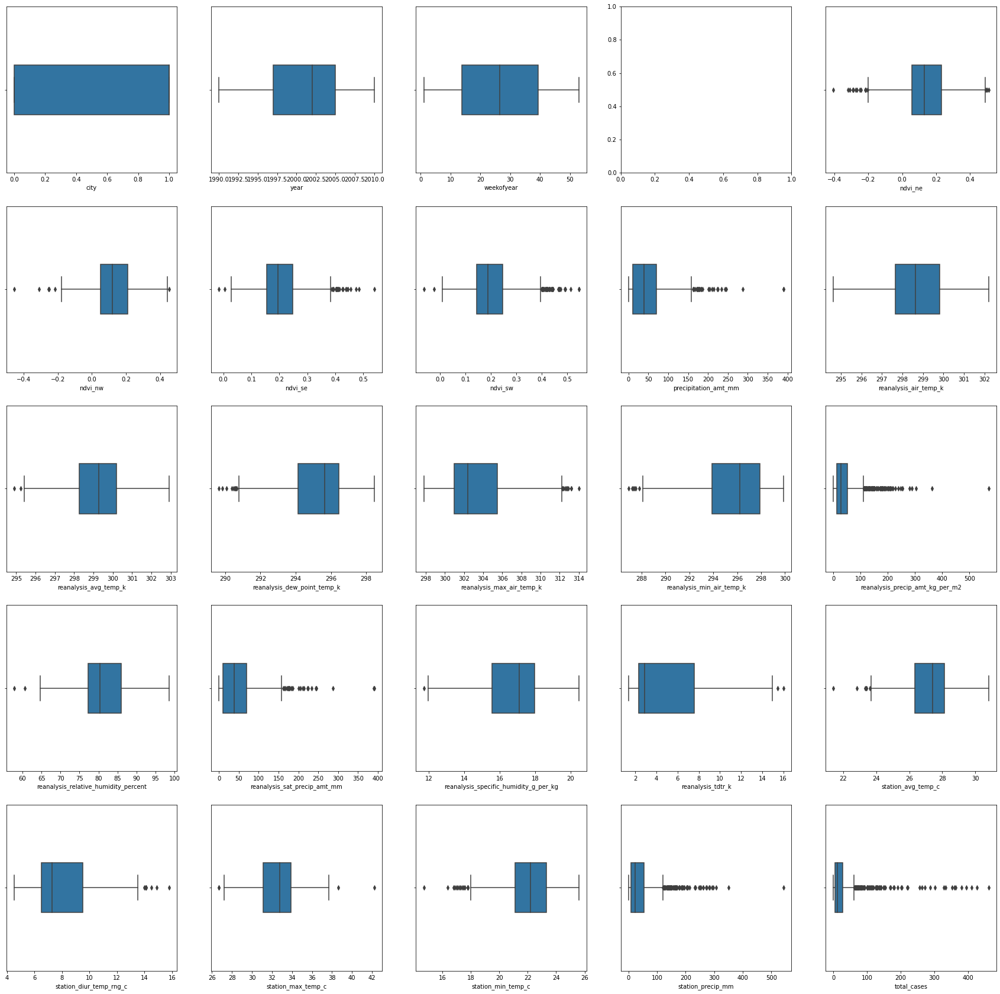

In [11]:
#boxplot matrix
fig, axes = plt.subplots(5,5, figsize=(30, 30)) # create figure and axes

for i,el in enumerate(list(df.columns)):
    if el == 'week_start_date':
      continue
    ax = axes.flatten()[i]
    sns.boxplot(x=el,data=df,width=0.3,ax=ax)

plt.show()

From the above box plot matrix, we see that 20 out of the 25 box plots show outliers. "Total_cases" is the target variable and will not have any outliers dropped. Most of the plots show more than seven outliers, and these outliers are most likely not due to errors when recording the data. To avoid skewing the first linear regression prediction we will try standardizing the variables with more than seven outliers. Those with less than seven outliers will be dropped and assumed that they were recorded by error. We will also incorporate other models such as random forest that will more easily handle outliers, and we can keep them in the data to see which model gives the best accuracy.

In [12]:
#calculting the z score, removing outliers that are more than 3 standard deviations from the mean
outlier_variables = ['ndvi_ne','ndvi_nw','reanalysis_avg_temp_k', 'reanalysis_max_air_temp_k'
,'reanalysis_min_air_temp_k','reanalysis_relative_humidity_percent','reanalysis_specific_humidity_g_per_kg'
,'reanalysis_tdtr_k','station_avg_temp_c','station_diur_temp_rng_c','station_max_temp_c']
z_scores = zscore(df[outlier_variables])
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 3).all(axis=1)
new_df = df[filtered_entries]


In [13]:
new_df.shape

(1423, 25)

In [14]:
#stad scaling
from sklearn.preprocessing import StandardScaler
trans_df = new_df
scaler = StandardScaler()
trans_df[outlier_variables] = scaler.fit_transform(new_df[outlier_variables])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


In [15]:
trans_df[outlier_variables]

,ndvi_ne,ndvi_nw,reanalysis_avg_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_relative_humidity_percent,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c
0,-0.149258,-0.236646,-1.214027,-1.131498,0.045637,-1.264945,-1.837413,-0.632519,-1.414499,-0.537078,-1.608021
1,0.225219,0.099232,-0.644863,-0.783377,0.246444,-0.695986,-0.937184,-0.706626,-0.394674,-0.794758,-0.394814
2,-0.864563,0.368211,-0.290588,-0.909966,0.607897,-0.030169,0.039640,-0.727212,-0.394674,-0.739043,-0.131073
3,-0.101492,0.998036,-0.006006,-0.625140,0.487413,-0.274038,-0.076671,-0.690158,0.212638,-0.599757,0.449156
4,0.433437,1.147703,0.348270,-0.466904,0.688220,-0.256575,0.278882,-0.521357,1.392885,0.667748,1.345874
...,...,...,...,...,...,...,...,...,...,...,...
1451,1.593681,1.643002,1.248478,2.001588,-0.516624,0.923985,1.123320,1.434260,1.144613,1.916681,1.556867
1452,0.148084,0.258185,0.127574,1.621820,-1.560822,1.326845,0.848144,0.763175,0.182081,1.217928,1.187630
1453,0.836076,0.133144,-1.335991,0.672400,-1.360015,1.707776,0.145550,0.771409,-2.250985,-0.537078,-0.131073
1454,1.523728,1.004192,-1.394069,0.862284,-1.560822,1.761788,0.017891,0.878453,-1.422138,0.356675,-0.658555


Above, we have standardized the variables that had outliers removed. Variables such as "reanalysis_max_air_temp_k" were on a much larger scale with a mean of (303.43) compared to that of the vegetation indices. Standardizing the variables now makes them more comparable and will make them less susceptible to skewing prediction results.

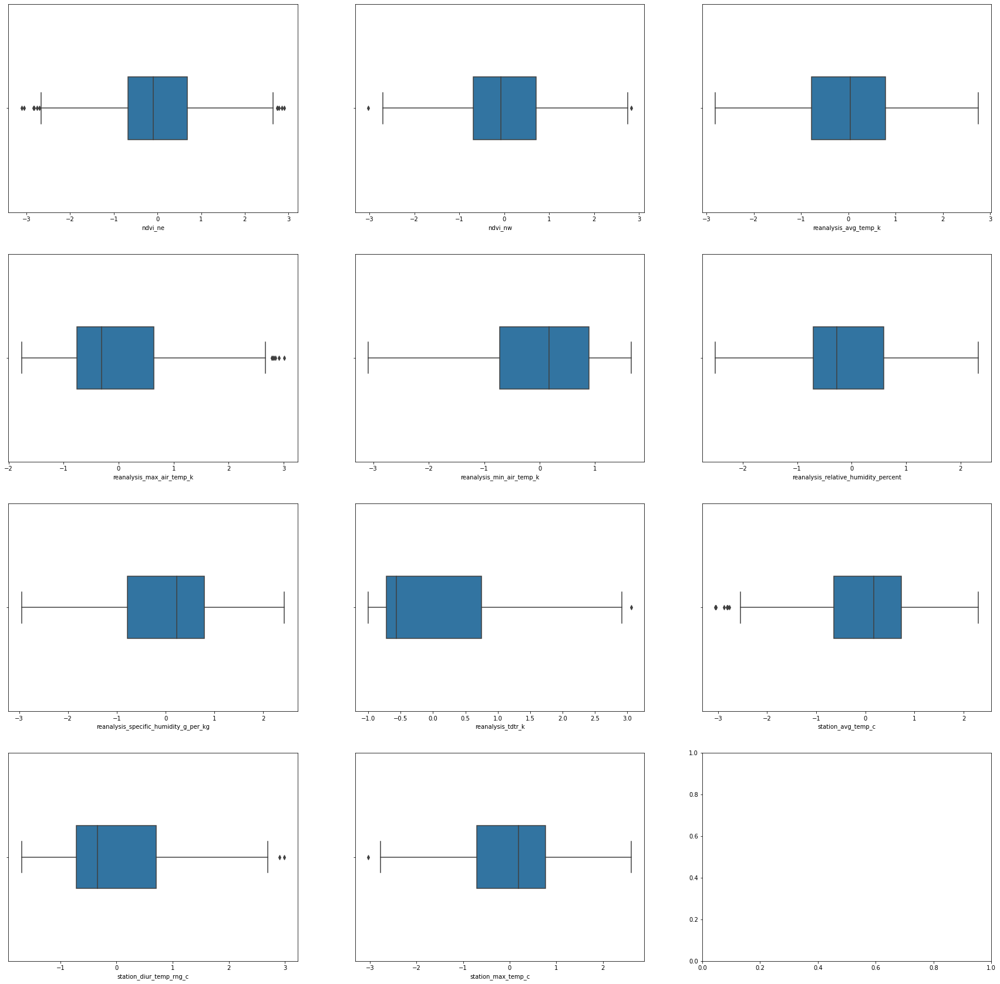

In [16]:
#boxplot after removing outlier
fig, axes = plt.subplots(4,3, figsize=(30, 30)) # create figure and axes

for i,el in enumerate(list(outlier_variables)):
    if el == 'week_start_date':
      continue
    ax = axes.flatten()[i]
    sns.boxplot(x=el,data=trans_df,width=0.3,ax=ax)

plt.show()

We have plotted a new box plot matrix for the standardized variables. We can see that each of them no show less outliers than before, after they each had outliers that were 3 or more standard deviations away dropped. A few variables like "station_diur_temp_rng_c" and "station_max_temp_c" still show some outlier behavior. After running a regression these variables may need to be log transformed to handle the continued outlier influence on the prediction.  

#Exploratory Data Analysis

In [17]:
#getting correlation matrix
corr = trans_df.corr()
corr

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
city,1.000000,-0.551265,0.009217,-0.709099,-0.688999,-0.470289,-0.576480,-0.316401,0.465149,0.060869,-0.139302,-0.840745,0.830632,-0.307242,-0.699332,-0.316401,-0.186949,-0.901352,-0.190862,-0.818129,-0.577508,0.422645,-0.352741,0.291847
year,-0.551265,1.000000,-0.069893,0.226798,0.154095,0.230816,0.275410,0.211250,-0.136574,0.094064,0.148753,0.487424,-0.391406,0.139192,0.348819,0.211250,0.177453,0.494493,0.058532,0.368281,0.234423,-0.208143,0.218634,-0.303829
weekofyear,0.009217,-0.069893,1.000000,0.038611,0.041848,0.115232,0.063041,0.117197,0.419061,0.457263,0.355199,0.224407,0.187551,0.073876,-0.010573,0.117197,0.355307,0.064380,0.359503,0.008140,0.222317,0.292454,0.064053,0.219011
ndvi_ne,-0.709099,0.226798,0.038611,1.000000,0.818041,0.600005,0.656272,0.189899,-0.345661,-0.049711,0.064090,0.619945,-0.620539,0.197387,0.477083,0.189899,0.099706,0.665348,0.169085,0.625432,0.455509,-0.307232,0.230877,-0.173065
ndvi_nw,-0.688999,0.154095,0.041848,0.818041,1.000000,0.566472,0.657101,0.186434,-0.331345,-0.042635,0.074696,0.606357,-0.597685,0.195936,0.473025,0.186434,0.110959,0.645461,0.195803,0.628161,0.478369,-0.301454,0.219468,-0.148580
ndvi_se,-0.470289,0.230816,0.115232,0.600005,0.566472,1.000000,0.819115,0.079538,-0.168062,0.043606,0.019448,0.464376,-0.412620,0.041955,0.240521,0.079538,0.044537,0.483166,0.093738,0.436105,0.291080,-0.251252,0.122924,-0.122990
ndvi_sw,-0.576480,0.275410,0.063041,0.656272,0.657101,0.819115,1.000000,0.129622,-0.240684,0.012063,0.039420,0.544537,-0.501526,0.110594,0.341242,0.129622,0.071013,0.567261,0.125564,0.528667,0.374081,-0.292129,0.154210,-0.145977
precipitation_amt_mm,-0.316401,0.211250,0.117197,0.189899,0.186434,0.079538,0.129622,1.000000,-0.020488,0.104718,0.431575,0.288965,-0.127031,0.478158,0.497994,1.000000,0.447214,0.209025,0.218258,0.192720,0.294024,0.071911,0.483594,-0.042389
reanalysis_air_temp_k,0.465149,-0.136574,0.419061,-0.345661,-0.331345,-0.168062,-0.240684,-0.020488,1.000000,0.899111,0.535277,-0.018459,0.745681,-0.133485,-0.407152,-0.020488,0.511395,-0.298663,0.604227,-0.272481,0.213535,0.723480,-0.178693,0.266302
reanalysis_avg_temp_k,0.060869,0.094064,0.457263,-0.049711,-0.042635,0.043606,0.012063,0.104718,0.899111,1.000000,0.631629,0.389348,0.438370,-0.033653,-0.159946,0.104718,0.627163,0.112900,0.742070,0.091414,0.501652,0.586094,-0.053577,0.153157


A correlation table was created to look for multicollinearity amongst the variables. 

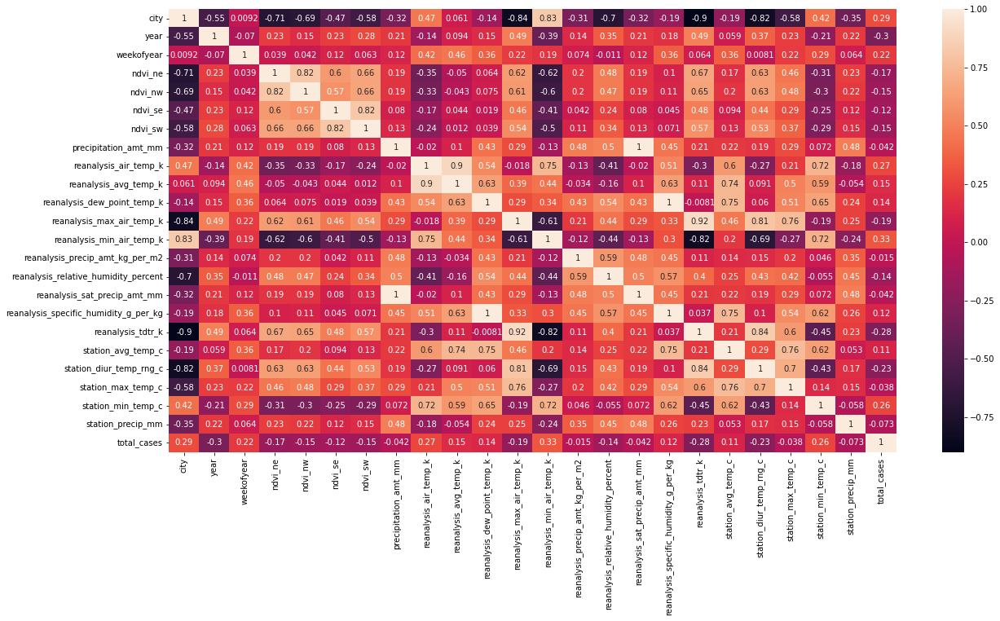

In [18]:
#plotting heat map
ax, fig = plt.subplots(figsize=[20,10])
sns.heatmap(corr, annot=True)


A heat map of the correlation matrix was generated. The lighter the color, the more positively correlated it is with a variable and vice-versa. This map makes it easier to spot multicollinearity. Here, there are many variables that might influence one another. For example, the satellite vegetation indices "ndvi" all seem to influence each other somewhat. The southeast centroid is 0.82 correlated with the southwest centroid. It may be best to keep only one southeast centroid. After running a regression and looking at VIF scores to confirm their influence on each other, one can be dropped from the model.

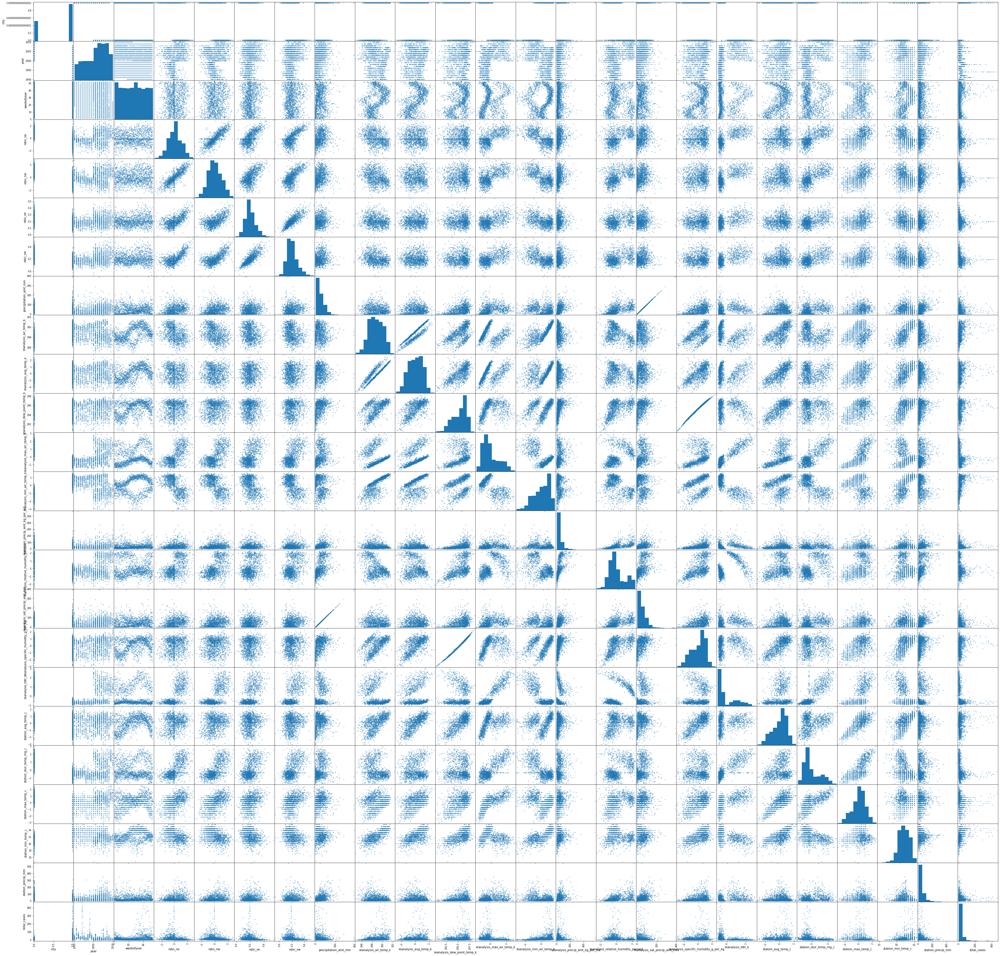

In [19]:
#plotting scatter matrix
scatter_matrix(trans_df,figsize=(60,60))
plt.show()

From the revised scatter plot matrix, we see several variables that are positively correlated with the total case count. These variables are: weekofyear, reanalysis_air_temp_k, reanalysis_avg_temp_k, reanalysis_dew_point_temp_k, reanalysis_min_air_temp_k, station_avg_temp_c, and station_min_temp_c. When holding each other variable equal, these variables will produce a larger amount of dengue cases. It is interesting to note that more total cases occur as it gets later in the year. This coincides with the rainy season in both cities. We can also see that typically as the air temperature, dew point, and humidity increase the more cases that arise.

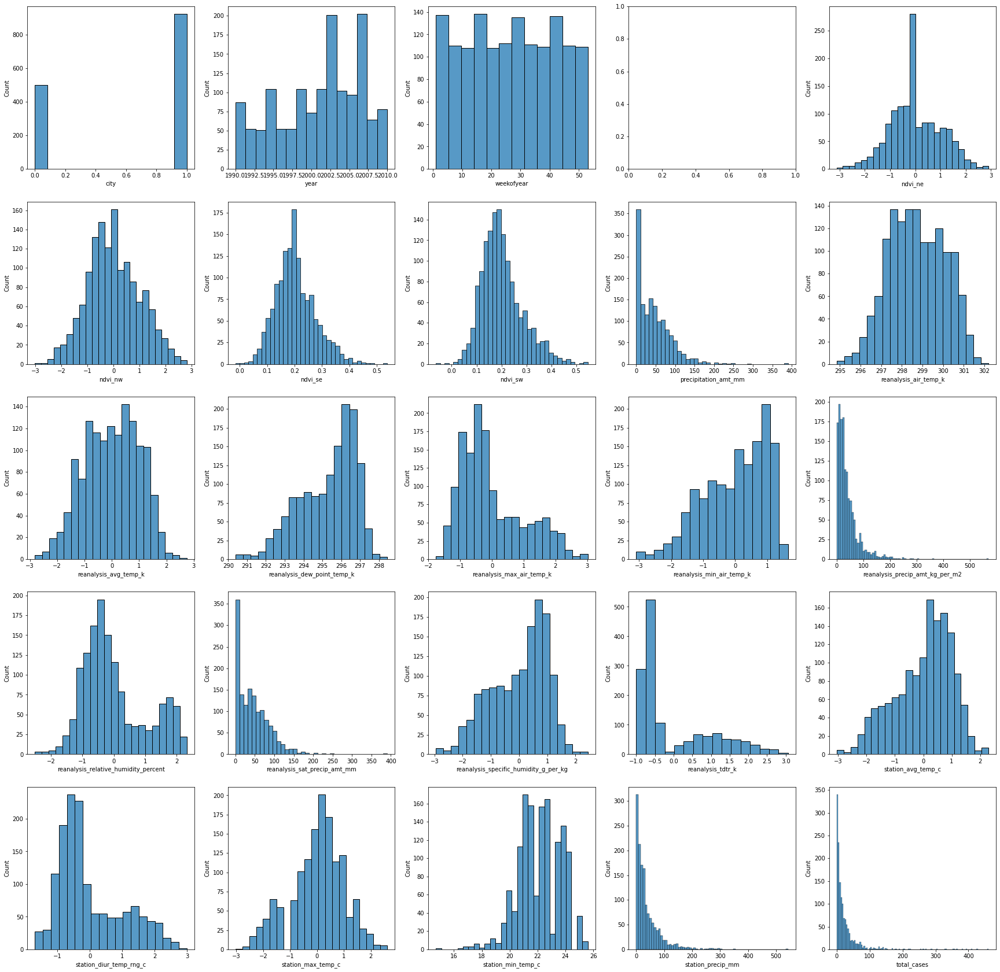

In [20]:
#plotting histogram for all variable to check skewness
fig, axes = plt.subplots(5,5, figsize=(30, 30)) 
for i,el in enumerate(list(trans_df.columns)):
    if el == 'week_start_date':
      continue
    ax = axes.flatten()[i]

    sns.histplot(trans_df[el] ,ax=axes.flatten()[i])
  
plt.show()

We have plotted a histogram matrix above for all the numerical variables. This is after dropping outliers and standardizing those variables that had outliers dropped. There is still some left and right tail skewness occurring in the distributions. For example, "reanalyis_dew_point_temp_k" is left tail skewed. This variable will most likely cause increasing case predictions if it is left as is. After running a regression, it can be transformed to account for the skewness. "Station_precip_mm" works in the opposite way as it is right tail skewed. It may also need to be transformed after running a regression and looking at the output coefficients.

In [21]:
# Create a mask for values above 90% 
# But also below 100% since it variables correlated with the same one
mask = (trans_df.corr() > 0.9) & (trans_df.corr() < 1.0)
high_corr_df = corr[mask]

In [22]:
#any will return item if iterations are true
col_to_filter_out = ~high_corr_df[mask].any()


In [23]:
#items which are false have high correlation,
col_to_filter_out

city                                      True
year                                      True
weekofyear                                True
ndvi_ne                                   True
ndvi_nw                                   True
ndvi_se                                   True
ndvi_sw                                   True
precipitation_amt_mm                      True
reanalysis_air_temp_k                     True
reanalysis_avg_temp_k                     True
reanalysis_dew_point_temp_k              False
reanalysis_max_air_temp_k                False
reanalysis_min_air_temp_k                 True
reanalysis_precip_amt_kg_per_m2           True
reanalysis_relative_humidity_percent      True
reanalysis_sat_precip_amt_mm              True
reanalysis_specific_humidity_g_per_kg    False
reanalysis_tdtr_k                        False
station_avg_temp_c                        True
station_diur_temp_rng_c                   True
station_max_temp_c                        True
station_min_t

A mask variable was created to find variables in the correlation matrix that would be the most correlated and interfere with prediction results. All boolean values for the variables are shown. Anything that has a correlation below 90% is listed as True and anything with above 90% is listed as False. The False columns can be dropped as they will most likely to be multicollinear. 

In [24]:
X_clean = df[high_corr_df.columns[col_to_filter_out]]


In [25]:
X_clean

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
0,1,1990,18,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,295.9,32.00,73.365714,12.42,25.442857,6.900000,29.4,20.0,16.0,4
1,1,1990,19,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,296.4,17.94,77.368571,22.82,26.714286,6.371429,31.7,22.2,8.6,5
2,1,1990,20,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,297.3,26.10,82.052857,34.54,26.714286,6.485714,32.2,22.8,41.4,4
3,1,1990,21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,297.0,13.90,80.337143,15.36,27.471429,6.771429,33.3,23.3,4.0,3
4,1,1990,22,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,297.5,12.20,80.460000,7.52,28.942857,9.371429,35.0,23.9,5.8,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1451,0,2010,21,0.342750,0.318900,0.256343,0.292514,55.30,299.334286,300.771429,294.5,45.00,88.765714,55.30,28.633333,11.933333,35.4,22.4,27.0,5
1452,0,2010,22,0.160157,0.160371,0.136043,0.225657,86.47,298.330000,299.392857,291.9,207.10,91.600000,86.47,27.433333,10.500000,34.7,21.7,36.6,8
1453,0,2010,23,0.247057,0.146057,0.250357,0.233714,58.94,296.598571,297.592857,292.4,50.60,94.280000,58.94,24.400000,6.900000,32.2,19.2,7.4,1
1454,0,2010,24,0.333914,0.245771,0.278886,0.325486,59.67,296.345714,297.521429,291.9,62.33,94.660000,59.67,25.433333,8.733333,31.2,21.0,16.0,1


New clean dataframe with variables that did not have correlation above 90% with another variable. 

In [26]:
X_clean.shape

(1456, 20)

In [27]:
!pip install sweetviz


     |████████████████████████████████| 15.1 MB 3.7 MB/s 


In [28]:
#getting report consisting association graph
import sweetviz as sv
my_report = sv.analyze(trans_df)
my_report.show_html()

                                             |          | [  0%]   00:00 -> (? left)

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


From the sweetviz page we can view the association plot. The squares are listed to depict how much one variable can imply another variable will occur. For example, the "city" variable will provide the vegetation index "ndvi" and the direction variables for it. A blue value is a positive implication, while a red value is negative. The circles show correlation coefficients like the heat map above. This gives another overview of multicollinearity that might occur when making predictions. 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


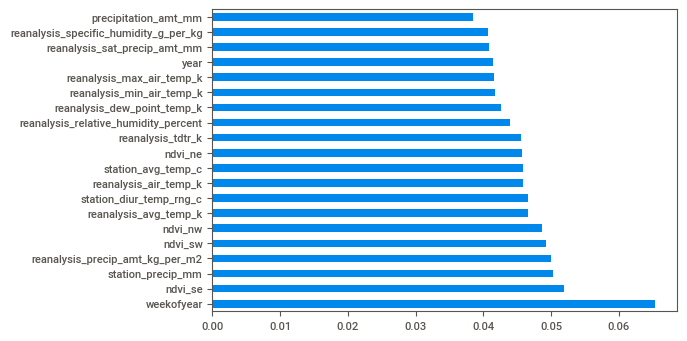

In [29]:
#getting the feature importance, 
#using random forest model to know which feature has greater impact on dependent variable
from sklearn.ensemble import RandomForestClassifier
trans_df.dropna(axis=0,how='any',inplace=True)
X = trans_df.drop(["total_cases","week_start_date"] , axis=1)
#X['DAY_DELTA'] = (X.TIMESTAMP - X.TIMESTAMP.min()).dt.days

y = trans_df['week_start_date']
model = RandomForestClassifier()
model.fit(X, y)

(pd.Series(model.feature_importances_, index=X.columns)
   .nlargest(20)
   .plot(kind='barh'))

We have run a random forest model above which lists the feature importance for each remaining variable in the data set in descending order. "Weekofyear" is shown as the best overall feature. When running our regression prediction, we can use this to create a threshold value. Any feature with less than 0.045 importance can be thrown out, and the remaining features can be kept. In this case, starting with "reanalysis_specific_humidity_g_per_kg" and below can be dropped before running a regression.

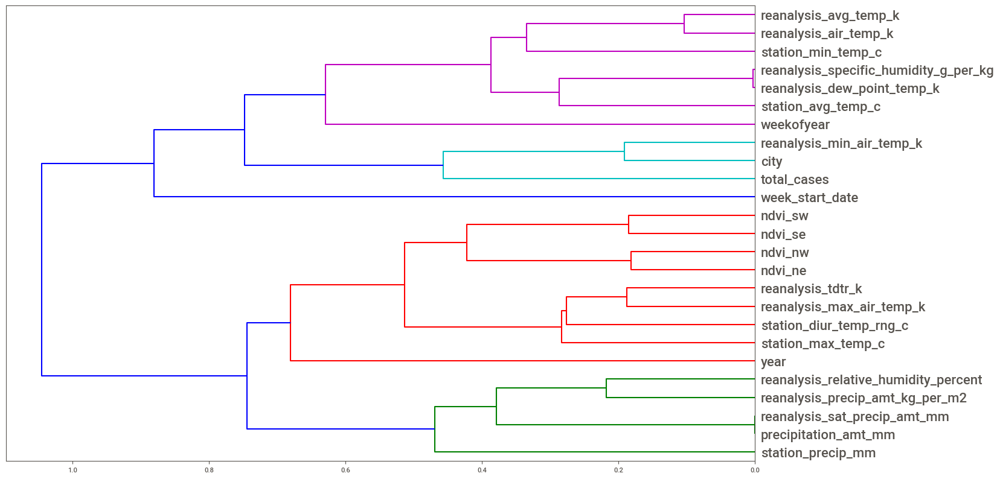

In [30]:
#correlation and hierarchical clustering using dendrogram for all variables
corr = np.round(scipy.stats.spearmanr(trans_df).correlation, 4)
corr_condensed = sch.distance.squareform(1-corr)
z = sch.linkage(corr_condensed, method='average')
fig = plt.figure(figsize=(16,10))
dendrogram = sch.dendrogram(z, labels=trans_df.columns, orientation='left', leaf_font_size=16)
plt.show()

The dendrogram above gives a visual on each feature, and depicts clustering relationship based on how related they are to other features. Again, we can view the correlation of the variables and see that variable such as "ndvi" and its directions are all quite correlated with two clusters next to each other. After running a prediction model, only one may need to be kept to best model a case of dengue. 

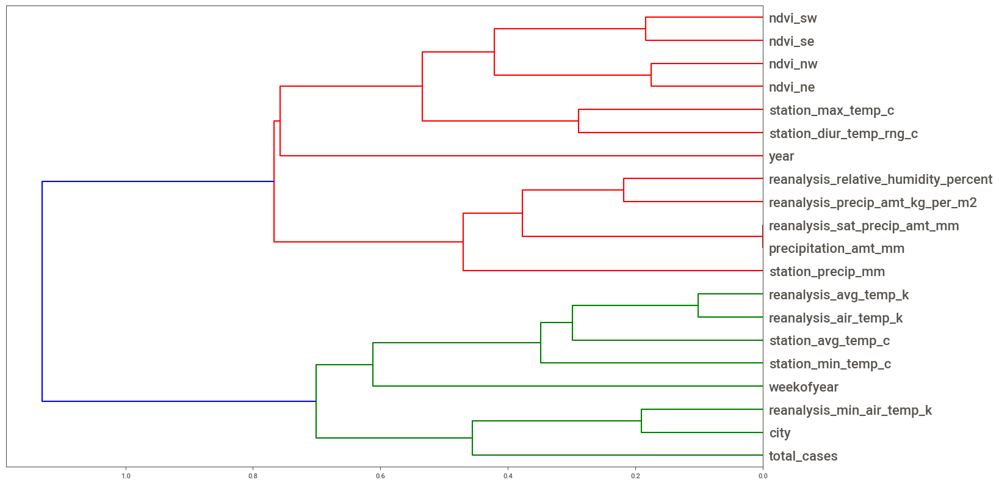

In [31]:
#correlation and hierarchical clustering using dendrogram for variables after dropping those that had correlation between 0.9 and 1 
corr = np.round(scipy.stats.spearmanr(X_clean).correlation, 4)
corr_condensed = sch.distance.squareform(1-corr)
z = sch.linkage(corr_condensed, method='average')
fig = plt.figure(figsize=(16,10))
dendrogram = sch.dendrogram(z, labels=X_clean.columns, orientation='left', leaf_font_size=16)
plt.show()

Lastly, this is a dendrogram depicting the most closely correlated variables - after dropping any variables that had a correlation coefficient greater than 0.90. For example, here variables "reanalysis_avg_temp_k" and "reanalysis_air_temp_k" have a high correlation. Therefore, only one may be needed in the final prediction model.

#Machine Learning and Evaluation

In [32]:
trans_df2 = trans_df.drop(trans_df.columns[[3, 7,10,15, 16]], axis=1)

trans_df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1423 entries, 0 to 1455
Data columns (total 20 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   city                                   1423 non-null   int64  
 1   year                                   1423 non-null   int64  
 2   weekofyear                             1423 non-null   int64  
 3   ndvi_ne                                1423 non-null   float64
 4   ndvi_nw                                1423 non-null   float64
 5   ndvi_se                                1423 non-null   float64
 6   precipitation_amt_mm                   1423 non-null   float64
 7   reanalysis_air_temp_k                  1423 non-null   float64
 8   reanalysis_dew_point_temp_k            1423 non-null   float64
 9   reanalysis_max_air_temp_k              1423 non-null   float64
 10  reanalysis_min_air_temp_k              1423 non-null   float64
 11  rean

Before running our regression, we imported variance_inflation_factor from statsmodels to calculate VIF scores of the features. This gives us another output value to test for multicollinearity amongst our features. Any features that have VIF scores above 10 can be dropped before running a regression model, as these features have a large amount of influence on another feature and will skew the results.

In [33]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = trans_df2.columns
  
# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(trans_df2.values, i)
                          for i in range(len(trans_df2.columns))]
  
print(vif_data)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


                                  feature            VIF
0                                    city      81.465678
1                                    year  277046.779008
2                              weekofyear       5.998880
3                                 ndvi_ne       3.749606
4                                 ndvi_nw       3.643032
5                                 ndvi_se      15.157246
6                    precipitation_amt_mm       3.666671
7                   reanalysis_air_temp_k  770261.913475
8             reanalysis_dew_point_temp_k  798013.925998
9               reanalysis_max_air_temp_k      21.886659
10              reanalysis_min_air_temp_k      21.883201
11        reanalysis_precip_amt_kg_per_m2       3.401286
12  reanalysis_specific_humidity_g_per_kg      22.277887
13                      reanalysis_tdtr_k      34.595048
14                     station_avg_temp_c       8.938161
15                station_diur_temp_rng_c       6.496024
16                     station_

In [34]:
vif_data[vif_data['VIF'] < 10]['feature']

2                          weekofyear
3                             ndvi_ne
4                             ndvi_nw
6                precipitation_amt_mm
11    reanalysis_precip_amt_kg_per_m2
14                 station_avg_temp_c
15            station_diur_temp_rng_c
16                 station_max_temp_c
18                  station_precip_mm
19                        total_cases
Name: feature, dtype: object

Drop any column with VIF greater than 10

In [35]:
VIF_X_clean = X_clean.drop(['weekofyear','ndvi_ne','ndvi_nw','precipitation_amt_mm','reanalysis_precip_amt_kg_per_m2','station_avg_temp_c','station_diur_temp_rng_c','station_max_temp_c','station_precip_mm'],axis=1)

Splitting dataset into train, valid and test datasets

In [36]:
#Splitting dataset into train, valid and test datasets
from sklearn.model_selection import train_test_split


X = trans_df.drop('total_cases',axis=1)
y = trans_df['total_cases']
X_df, X_test, y_df, y_test = train_test_split(X, y, test_size=0.50)
#X_train, X_valid, y_train, y_valid = train_test_split(X_df, y_df, test_size=0.33)

#clean dataset
X_clean_1 = X_clean.drop('total_cases',axis=1)
y_clean_1 = X_clean['total_cases']
X_clean_df, X_clean_test, y_clean_df, y_clean_test = train_test_split(X_clean_1, y_clean_1, test_size=0.50)
#X_clean_train, X_clean_valid, y_clean_train, y_clean_valid = train_test_split(X_clean_df, y_clean_df, test_size=0.33)

#vif clean dataset
X_vif_clean = VIF_X_clean.drop('total_cases',axis=1)
y_vif_clean = VIF_X_clean['total_cases']
X_vif_clean_df, X_vif_clean_test, y_vif_clean_df, y_vif_clean_test = train_test_split(X_vif_clean, y_vif_clean, test_size=0.50)


The three dataframes differ in that trans_df consisted of all original features after those with extreme outliers had been standardized. X_clean contained the same features as trans_df, but several were removed that contained correlations greater than 90% with other features based on the correlation matrix. Lastly, VIF_X_clean had the same features as trans_df, but those with VIF scores greater than 10 were dropped from it. Each of the dataframes were used in modeling to see which dataframe would generalize the predictions the best to the test set.

(Part 1) - Use the weather data belonging to each city to train on and then predict the Dengue count in the test set



```
# This is formatted as code
```

We will apply the models to our datasets on train and test splits

In [37]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,mean_absolute_error

lin_reg = LinearRegression(fit_intercept=True,)
lin_X_train = X_df.drop('week_start_date',axis=1)
lin_reg.fit(lin_X_train,y_df) 
lin_X_valid = X_test.drop('week_start_date',axis=1)
lin_reg_pred_y = lin_reg.predict(lin_X_valid)

mse_linear_reg = mean_squared_error(lin_reg_pred_y, y_test)
mae_linear_reg = mean_absolute_error(lin_reg_pred_y, y_test)
mse_linear_reg,mae_linear_reg

(2040.6483379215083, 20.904473384845122)

The Linear Regression will be the baseline prediction value we will compare our models to 

Testing on clean dataset

In [38]:

lin_reg = LinearRegression(fit_intercept=True,)
lin_reg.fit(X_clean_df,y_clean_df) 
lin_reg_pred_y_clean = lin_reg.predict(X_clean_test)

mse_linear_reg_clean = mean_squared_error(lin_reg_pred_y_clean, y_clean_test)
mae_linear_reg_clean = mean_absolute_error(lin_reg_pred_y_clean, y_clean_test)
mse_linear_reg_clean,mae_linear_reg_clean

(1959.6444224742388, 21.257591592770535)

Testing on VIF clean dataset

In [39]:
lin_reg = LinearRegression(fit_intercept=True,)
lin_reg.fit(X_vif_clean_df,y_vif_clean_df) 
lin_reg_pred_y_clean = lin_reg.predict(X_vif_clean_test)

mse_linear_reg_clean = mean_squared_error(lin_reg_pred_y_clean, y_vif_clean_test)
mae_linear_reg_clean = mean_absolute_error(lin_reg_pred_y_clean, y_vif_clean_test)
mse_linear_reg_clean,mae_linear_reg_clean

(1605.15004114926, 19.44000343697142)

Random Forest

In [40]:
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
rf_model = RandomForestRegressor(n_estimators=1000,min_samples_leaf=3,max_features=0.555,n_jobs=-1,warm_start=True,oob_score=True)

In [41]:
rf_X_train = X_df.drop('week_start_date',axis=1)
rf_model.fit(rf_X_train,y_df) 
rf_X_valid = X_test.drop('week_start_date',axis=1)
rf_reg_pred_y = rf_model.predict(rf_X_valid)

mse_rf_reg = mean_squared_error(rf_reg_pred_y, y_test )
mae_rf_reg = mean_absolute_error(rf_reg_pred_y, y_test )
mse_rf_reg,mae_rf_reg

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:446: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  "X does not have valid feature names, but"


(1148.905685860509, 15.249733223820567)

In [42]:
rf_model = RandomForestRegressor(n_estimators=1000,min_samples_leaf=3,max_features=0.555,n_jobs=-1,warm_start=True,oob_score=True)
rf_model.fit(X_clean_df ,y_clean_df) 
rf_reg_pred_y_clean = rf_model.predict(X_clean_test)

mse_rf_reg_clean = mean_squared_error(rf_reg_pred_y_clean, y_clean_test )
mae_rf_reg_clean = mean_absolute_error(rf_reg_pred_y_clean, y_clean_test )
mse_rf_reg_clean,mae_rf_reg_clean

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:446: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  "X does not have valid feature names, but"


(1519.8572200023457, 16.94374945819024)

Vif clean dataset

In [43]:
rf_model = RandomForestRegressor(n_estimators=1000,min_samples_leaf=3,max_features=0.555,n_jobs=-1,warm_start=True,oob_score=True)
rf_model.fit(X_vif_clean_df ,y_vif_clean_df) 
rf_reg_pred_y_clean = rf_model.predict(X_vif_clean_test)

mse_rf_reg_clean = mean_squared_error(rf_reg_pred_y_clean, y_vif_clean_test  )
mae_rf_reg_clean = mean_absolute_error(rf_reg_pred_y_clean, y_vif_clean_test  )
mse_rf_reg_clean,mae_rf_reg_clean

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:446: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  "X does not have valid feature names, but"


(1083.576799994695, 15.632156984187237)

XGBoost

In [44]:
import xgboost as xgb
xg_model = xgb.XGBRegressor(colsample_bytree = 0.3, learning_rate = 0.1,max_depth = 5, alpha = 10, n_estimators = 1000,n_jobs=10)

In [45]:
xg_X_train = X_df.drop('week_start_date',axis=1)
xg_model.fit(xg_X_train,y_df) 
xg_X_valid = X_test.drop('week_start_date',axis=1)
xg_reg_pred_y = xg_model.predict(xg_X_valid)

mse_rf_reg = mean_squared_error(xg_reg_pred_y, y_test )
mae_rf_reg = mean_absolute_error(xg_reg_pred_y, y_test )
mse_rf_reg,mae_rf_reg

[03:45:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


(853.9044621306186, 14.341886119017106)

Clean dataset

In [46]:
xg_model.fit(X_clean_df,y_clean_df ) 
xg_reg_pred_y = xg_model.predict(X_clean_test)

mse_rf_reg = mean_squared_error(xg_reg_pred_y, y_clean_test  )
mae_rf_reg = mean_absolute_error(xg_reg_pred_y, y_clean_test  )
mse_rf_reg,mae_rf_reg

[03:45:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


(964.9719867220457, 15.117595374133888)

VIF clean dataset

In [47]:
xg_model.fit(X_vif_clean_df ,y_vif_clean_df  ) 
xg_reg_pred_y = xg_model.predict(X_vif_clean_test  )

mse_rf_reg = mean_squared_error(xg_reg_pred_y, y_vif_clean_test   )
mae_rf_reg = mean_absolute_error(xg_reg_pred_y, y_vif_clean_test   )
mse_rf_reg,mae_rf_reg

[03:45:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


(938.19666435528, 16.15357206372933)

The best performing model was again trans_df. This was the best dataframe since features are chosen at random to be used in the modeling. XGBoost is able to incorporate all features within its implementation and use the strongest features to make predictions. The dataframes that had features dropped would not be able to have all features contribute to the learning process.

In summary, for part one, the best overall model came from using XGBoost as it had the lowest MSE and MAE of (567.39, 13.33) using the trans_df dataframe. The XGBoost results were able to significantly improve upon the baseline case predictions set by the Linear Regression values which were around 20 for the MAE.

Part 2 of this study was done to see how well similar climates could be used to predict the spread of Dengue. If the San Juan weather data could be used to predict Dengue cases in Iquitos effectively, then we could get a clearer idea on how likely Dengue is to spread at locations with similar climates like Singapore and Southern part of the United States.


In [48]:
trans_df['city'].value_counts()

1    922
0    501
Name: city, dtype: int64

Training on SF dataset (1) and testing on IQ dataset (0)

Transform dataset splitting

In [49]:
sj_trans_df = trans_df[trans_df['city']==1]

#spliting SJ into X and Y
sj_trans_X , sj_trans_y = sj_trans_df.drop('total_cases',axis=1) , sj_trans_df['total_cases']

iq_trans_df = trans_df[trans_df['city']==0]
#splitting IQ into X and Y
iq_trans_X , iq_trans_y = iq_trans_df.drop('total_cases',axis=1) , iq_trans_df['total_cases']

In [50]:
sj_trans_X.shape, iq_trans_X.shape

((922, 24), (501, 24))

Clean dataset splitting

In [51]:
sj_clean_df = X_clean[X_clean['city']==1]


#spliting SJ into X and Y
sj_clean_X , sj_clean_y = sj_clean_df.drop('total_cases',axis=1) , sj_clean_df['total_cases']

iq_clean_df = X_clean[X_clean['city']==0]
#splitting IQ into X and Y
iq_clean_X , iq_clean_y = iq_clean_df.drop('total_cases',axis=1) , iq_clean_df['total_cases']

VIF clean dataset

In [52]:
sj_vif_df = VIF_X_clean[VIF_X_clean['city']==1]

#spliting SJ into X and Y
sj_vif_X , sj_vif_y = sj_vif_df.drop('total_cases',axis=1) , sj_vif_df['total_cases']

iq_vif_df = VIF_X_clean[VIF_X_clean['city']==0]

#splitting IQ into X and Y
iq_vif_X , iq_vif_y = iq_vif_df.drop('total_cases',axis=1) , iq_vif_df['total_cases']

Linear Regression

In [53]:
lin_reg = LinearRegression(fit_intercept=True,)
lin_sj_X_train = sj_trans_X.drop('week_start_date',axis=1)
lin_reg.fit(lin_sj_X_train,sj_trans_y)
lin_iq_X = iq_trans_X.drop('week_start_date',axis=1)
lin_reg_pred_y = lin_reg.predict(lin_iq_X)

mse_linear_reg = mean_squared_error(lin_reg_pred_y, iq_trans_y)
mae_linear_reg = mean_absolute_error(lin_reg_pred_y, iq_trans_y)
mse_linear_reg,mae_linear_reg


(1105.4098048284752, 27.37030098451741)

Linear Regression on Clean dataset

In [54]:
lin_reg = LinearRegression(fit_intercept=True,)
lin_reg.fit(sj_clean_X,sj_clean_y)
lin_reg_pred_y = lin_reg.predict(iq_clean_X)

mse_linear_reg = mean_squared_error(lin_reg_pred_y, iq_clean_y)
mae_linear_reg = mean_absolute_error(lin_reg_pred_y, iq_clean_y)
mse_linear_reg,mae_linear_reg


(1164.4781394534061, 28.913657376780563)

Linear Regression on VIF dataset

In [55]:
lin_reg = LinearRegression(fit_intercept=True,)
lin_reg.fit(sj_vif_X ,sj_vif_y )
lin_reg_pred_y = lin_reg.predict(iq_vif_X )

mse_linear_reg = mean_squared_error(lin_reg_pred_y, iq_vif_y )
mae_linear_reg = mean_absolute_error(lin_reg_pred_y, iq_vif_y )
mse_linear_reg,mae_linear_reg


(1278.831452922479, 31.747689752260282)

Random Forest

In [56]:
rf_model = RandomForestRegressor(n_estimators=1000,min_samples_leaf=3,max_features=0.555,n_jobs=-1,warm_start=True,oob_score=True)
rf_X_train = sj_trans_X.drop('week_start_date',axis=1)
rf_model.fit(rf_X_train,sj_trans_y ) 
rf_X_valid = iq_trans_X.drop('week_start_date',axis=1)
rf_reg_pred_y = rf_model.predict(rf_X_valid)

mse_rf_reg = mean_squared_error(rf_reg_pred_y, iq_trans_y  )
mae_rf_reg = mean_absolute_error(rf_reg_pred_y, iq_trans_y  )
mse_rf_reg,mae_rf_reg

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:446: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  "X does not have valid feature names, but"


(2636.1227982652704, 41.231068010053264)

Random forest on clean dataset

In [57]:
rf_model = RandomForestRegressor(n_estimators=1000,min_samples_leaf=3,max_features=0.555,n_jobs=-1,warm_start=True,oob_score=True)

rf_model.fit(sj_clean_X   ,sj_clean_y  ) 
rf_reg_pred_y = rf_model.predict(iq_clean_X  )

mse_rf_reg = mean_squared_error(rf_reg_pred_y, iq_clean_y    )
mae_rf_reg = mean_absolute_error(rf_reg_pred_y, iq_clean_y    )
mse_rf_reg,mae_rf_reg

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:446: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  "X does not have valid feature names, but"


(2013.6167832324418, 33.281307569417464)

Random forest on VIF clean dataset

In [58]:
rf_model = RandomForestRegressor(n_estimators=1000,min_samples_leaf=3,max_features=0.555,n_jobs=-1,warm_start=True,oob_score=True)

rf_model.fit(sj_vif_X    ,sj_vif_y   ) 
rf_reg_pred_y = rf_model.predict(iq_vif_X   )

mse_rf_reg = mean_squared_error(rf_reg_pred_y, iq_vif_y     )
mae_rf_reg = mean_absolute_error(rf_reg_pred_y, iq_vif_y     )
mse_rf_reg,mae_rf_reg

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:446: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  "X does not have valid feature names, but"


(437.6625342208025, 18.71621091468016)

XGBoost 

In [59]:
xg_model = xgb.XGBRegressor(colsample_bytree = 0.3, learning_rate = 0.1,max_depth = 5, alpha = 10, n_estimators = 1000,n_jobs=10)

In [60]:
xg_X_train = sj_trans_X.drop('week_start_date',axis=1)
xg_model.fit(xg_X_train,sj_trans_y ) 
xg_X_valid = iq_trans_X.drop('week_start_date',axis=1)
xg_reg_pred_y = xg_model.predict(xg_X_valid )

mse_rf_reg = mean_squared_error(xg_reg_pred_y, iq_trans_y  )
mae_rf_reg = mean_absolute_error(xg_reg_pred_y, iq_trans_y  )
mse_rf_reg,mae_rf_reg

[03:46:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


(4668.498499095712, 64.61486705620132)

XGBoost on clean dataset

In [61]:
xg_model.fit(sj_clean_X ,sj_clean_y  ) 
xg_reg_pred_y = xg_model.predict(iq_clean_X  )

mse_rf_reg = mean_squared_error(xg_reg_pred_y, iq_clean_y    )
mae_rf_reg = mean_absolute_error(xg_reg_pred_y, iq_clean_y    )
mse_rf_reg,mae_rf_reg

[03:46:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


(1113.9802669162825, 27.107277058179562)

XGBoost on VIF clean dataset

In [62]:
xg_model.fit(sj_vif_X  ,sj_vif_y ) 
xg_reg_pred_y = xg_model.predict(iq_vif_X   )

mse_rf_reg = mean_squared_error(xg_reg_pred_y, iq_vif_y     )
mae_rf_reg = mean_absolute_error(xg_reg_pred_y, iq_vif_y     )
mse_rf_reg,mae_rf_reg

[03:46:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


(643.034196001443, 20.674046354912793)

In [63]:
import xgboost as xgb
from sklearn.metrics import accuracy_score
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe
from sklearn.metrics import r2_score

In [64]:
def objective(space):
    clf=xgb.XGBRegressor(
                    n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']))
    
    evaluation = [( sj_vif_X , sj_vif_y ), ( iq_vif_X , iq_vif_y )]
    
    clf.fit(sj_vif_X, sj_vif_y,
            eval_set=evaluation,
            early_stopping_rounds=10,verbose=False)
    

    pred = clf.predict(iq_vif_X)
    #accuracy = accuracy_score(iq_vif_y, pred>0.5)
    #accuracy = accuracy_score(pred,iq_vif_y)
    accuracy =  mean_absolute_error(pred,iq_vif_y)
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }

Parameter tuning using XGBoost

In [65]:
space={'max_depth': hp.quniform("max_depth", 3, 18, 1),
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_alpha' : hp.quniform('reg_alpha', 40,180,1),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': 180,
        'seed': 0,

    }

In [66]:
trials = Trials()
print(trials)
best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 35,
                        trials = trials)

[03:46:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
SCORE:
6.2726932745713455
[03:46:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
SCORE:
6.282977537008432
[03:46:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
SCORE:
6.846444812187782
[03:46:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
SCORE:
6.269818907517653
[03:46:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
SCORE:
6.275376370319953
[03:46:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
SCORE:
6.300448933931498
[03:46:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now d

In [67]:
print("The best hyperparameters are : ","\n")
print(best_hyperparams)


The best hyperparameters are :  

{'colsample_bytree': 0.9608111121484465, 'gamma': 7.657174552667314, 'max_depth': 12.0, 'min_child_weight': 7.0, 'reg_alpha': 172.0, 'reg_lambda': 0.2736468019390288}


Testing above parameters on our dataset

In [68]:
xg_model = xgb.XGBRegressor(colsample_bytree= 0.9842064063014879, gamma= 1.0120046724635077, max_depth= 10, min_child_weight= 7.0, reg_alpha= 173.0, reg_lambda= 0.23298772609382737)

VIF dataset

In [69]:
xg_model.fit(sj_vif_X  ,sj_vif_y ) 
xg_reg_pred_y = xg_model.predict(iq_vif_X   )

mse_rf_reg = mean_squared_error(xg_reg_pred_y, iq_vif_y     )
mae_rf_reg = mean_absolute_error(xg_reg_pred_y, iq_vif_y     )
mse_rf_reg,mae_rf_reg

[03:46:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


(199.9029942969907, 10.752458434380017)

Clean dataset

In [70]:
xg_model.fit(sj_clean_X ,sj_clean_y  ) 
xg_reg_pred_y = xg_model.predict(iq_clean_X  )

mse_rf_reg = mean_squared_error(xg_reg_pred_y, iq_clean_y    )
mae_rf_reg = mean_absolute_error(xg_reg_pred_y, iq_clean_y    )
mse_rf_reg,mae_rf_reg

[03:46:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


(175.87631193820104, 9.204941143382054)

This XGBoost model again gives the best performance out of any. It has the lowest MSE and MAE values after tuning the hyperparameters.

In summary, since we can beat the baseline performance of 20 MAE, we can more confidently conclude that Dengue is likely to spread to warm, tropic climates around the globe.

#Evaluation

The two main methods of evaluation for this project were Mean Absolute Error and Mean Squared Error. The MAE provides the average difference observed in the predicted and actual values across the whole test set. It doesn’t matter if the prediction is higher or lower than the actual value, the method just looks at the absolute value. A lower value indicates better accuracy. This is a good evaluation metric to use when outliers are not concerning, although our data set contained many. The MSE was incorporated as an alternative metric that more easily handled outliers to measure performance. This method assigns more weight to bigger error values and takes the average of them. Again, the lower the value the better. When taking both the MAE and MSE values into account we see that the XGBoost model was the most successful at making predictions. This model beat the baseline performance and gave the lowest error values. This is due to the model using all features and weighting the prediction values they make.

#Conclusion

After going through the exploratory data analysis and modeling process we can answer the research questions we were interested in at the beginning of this project. Most notably, that the total case predictions of Dengue all increased as the dew point temperature, humidity, and vegetation index all increased. More so, a unique thing about our data is that we found that Dengue case predictions coincided with the “rainy” season of both Iquitos and San Juan and led to an increase in Dengue cases overall. To start our EDA process, we looked at the percentage of missing data from the features. Nothing was missing greater than 50% of the values, so we had to impute on any feature that did have missing values. Only one vegetation index feature contained missing values more than 10%. Median imputation was chosen to fill in the missing values, as so to try to lessen the skewness in the results rather than using mean imputation since many of the features contained outliers. After reviewing the data for outliers using box plots, we were able to verify that many of our features contained significant outliers. We came up with a couple of assumptions to handle them. First, if any features had seven or less outliers these could be assumed to be caused by error and could be dropped from the data. Second, any features with remaining outliers could be log transformed and standardized to reduce their impact on the predictions. The only further cleaning of the data that needed to be performed was to convert city to a categorical value using label encoding. Once the data was cleaned and pre-processed it could be used in the modeling phase and evaluated. The modeling phase was done in two parts. In part one, the weather data belonging to each city was used to train on and then predict the Dengue count in the test set. In part two, the models were trained on the weather data of San Juan, and then the Iquitos data was used for Dengue case testing. Our goal here was to confirm that Dengue is likely to spread to warm, tropical climates around the globe, and places with similar seasonal weather patterns to San Juan and Iquitos could prove to be potential breeding grounds for Dengue in the future. We chose to use linear regression, random forest, and XGBoost as our designated modeling techniques in this project. The models would be evaluated on their mean absolute error and mean squared error, as they both handle outliers in the data differently and can give an encompassing view of the overall performance of the models. Furthermore, the models were applied to three different dataframes. Those being 1) Trans_df – with solely standardized data, 2) X_clean – with standardized and the removal of highly correlated features based on the correlation matrix data, and 3) VIF_X_clean – with standardized and the removal of features with VIF scores greater than 10 to reduce multicollinearity. After running all the models, the tuned XGBoost (with training data from San Juan, and testing data from Iquitos) model was able to produce the best performance with the lowest MAE (9.20) and MSE (175.88) values on the trans_df and X_clean dataframes, as well as significantly beating the baseline MAE performance value of 20. This is not surprising since boosting takes a subset of the features and builds sequential models off them, and weights each of the features as it makes predictions. Over time, boosting can pick the least number of features that make the best predictions, as was true in our case. This allowed us to confirm our goal that Dengue is likely to spread to warm, tropical climates around the globe, and places with similar seasonal weather patterns to San Juan and Iquitos. One of the major problems we encountered when running this project was in the tuning of the XGBoost model hyperparameters and defining its function. It was necessary for us to take the time to read the documentation on how to fill in each of the parameters, otherwise we would get an unending list of errors when running the function. Once we were able to get the accuracy to print out MAE values rather than AUC values, we were able to get the function to work, and complete the code for the project.